# Plankton Identifier - Classification from plankton imager

This document provides code to train and run a CNN to classify plankton from images from the plankton imager. It treats this problem as a classification task. The labels are extracted from the folder names.

## Import modules and set parameters

In [1]:
import fastai
from fastai.vision.all import *
print ('You are using FastAI version: ' + fastai.__version__)
# FastAI version in counting paper: 2.0.13

You are using FastAI version: 2.7.13


In [2]:
filename = 'Plankton_imager_v03' # Insert your filename, for repeated experiments with different trainings hyperparameters (see below)
bs = 600 # Insert highest working batchsize here (limited by hardware)
np.random.seed(3)

NOTE TO SELF:

When a class n=1, it gives an error when it ends up in the validation set (and not in the training set). Easy work around is to reset random seed, and hope it ends up in the training set this time.

Nb: bs = 600 gave a usage of ~55000MiB on each GPU (2x A100)

## Getting the data

In [3]:
# Get image paths
path = Path('data/OSPAR_merged');
path.ls()

(#12) [Path('data/OSPAR_merged/artefacts'),Path('data/OSPAR_merged/diatoms'),Path('data/OSPAR_merged/detritus'),Path('data/OSPAR_merged/holoplankton'),Path('data/OSPAR_merged/fish_eggs'),Path('data/OSPAR_merged/gelatinous'),Path('data/OSPAR_merged/bubbles'),Path('data/OSPAR_merged/phytoplankton_other'),Path('data/OSPAR_merged/copepods'),Path('data/OSPAR_merged/fish_larvae')...]

In [4]:
fnames = get_image_files(path)
fnames[:3]

(#3) [Path('data/OSPAR_merged/artefacts/pia6.2023-06-01.1110+N00065587.tif'),Path('data/OSPAR_merged/artefacts/pia6.2023-06-01.1110+N00063889.tif'),Path('data/OSPAR_merged/artefacts/pia6.2023-06-13.0550+N00082634.tif')]

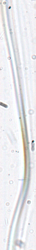

In [5]:
# Check single image
testfoto = str(fnames[0])
img = Image.open(testfoto)
img.to_thumb(250.250)

## Creating a dataset

In [6]:
# Create dataset

block = DataBlock(blocks=(ImageBlock, CategoryBlock), # for regression, change this CategoryBlock
                  splitter=RandomSplitter(),
                  get_items = get_image_files, 
                  get_y = parent_label,
                  #item_tfms=Resize((770,1040), method='squish'), 
                  item_tfms=Resize(300, ResizeMethod.Pad, pad_mode='zeros'), # see page 73 book
                  batch_tfms=[*aug_transforms( #https://docs.fast.ai/vision.augment#aug_transforms
                      mult=1.0, 
                      do_flip=True,
                      flip_vert=True,
                      max_rotate=0.2,
                      min_zoom=1.0,
                      max_zoom=1.1,
                      max_lighting=0.3,
                      max_warp=0.1,
                      p_affine=0.5,
                      p_lighting=0.5,
                      pad_mode='zeros'), 
                              Normalize.from_stats(*imagenet_stats)] 
                 )

In [7]:
#dls = block.dataloaders(df,bs=bs)
dls = block.dataloaders(path, bs=bs)

In [8]:
# Check tensor shapes
x,y=dls.one_batch()
x.shape,y.shape

(torch.Size([600, 3, 300, 300]), torch.Size([600]))

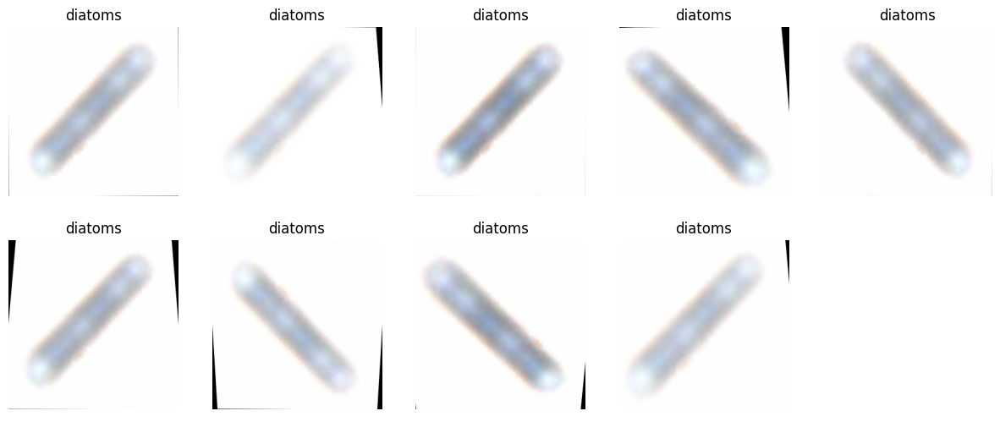

In [9]:
# Show data and check transforms
dls.show_batch(nrows=2, ncols=5, unique=True)

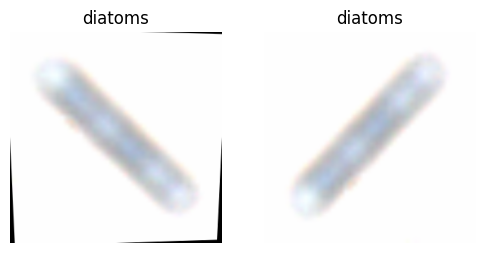

In [10]:
# Show data (= 1 bs) from train set
dls.train.show_batch(max_n=2, nrows=1, unique=True)

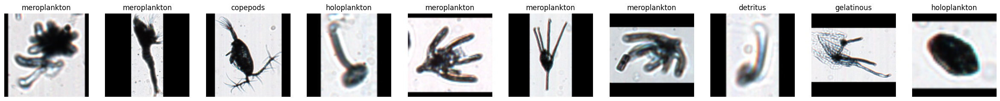

In [11]:
# Show data (= 1 bs) from validation set
dls.valid.show_batch(max_n=10, nrows=1)

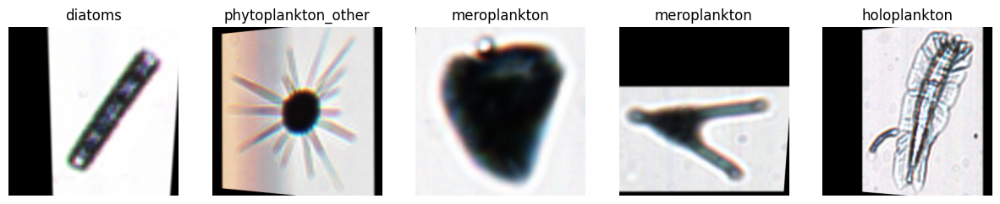

In [12]:
# Show data (= 1 bs) from training
dls.show_batch(nrows=1, ncols=5)

## Train model

In [13]:
# Create Learner
learn = vision_learner(dls, resnet50, #loss_func=Huber(), # different ResNets and Loss functions can be specified here
                    metrics=error_rate
                   ); # creates pretrained model
learn.model = torch.nn.DataParallel(learn.model) # Parallels computations over multiplle GPUs

print('This is Plankton Identifier version: ' + filename) # See top
print('The batchsize is set at:', bs) # See top
print('The loss function is:', learn.loss_func) # Double check current loss func

This is Plankton Identifier version: Plankton_imager_v03
The batchsize is set at: 600
The loss function is: FlattenedLoss of CrossEntropyLoss()


In [14]:
learn.save(filename + '_stage-1_00'); # Saves pretrained model, for repetitive trials

#### Stage 1 (frozen model)

SuggestedLRs(valley=0.0010000000474974513)

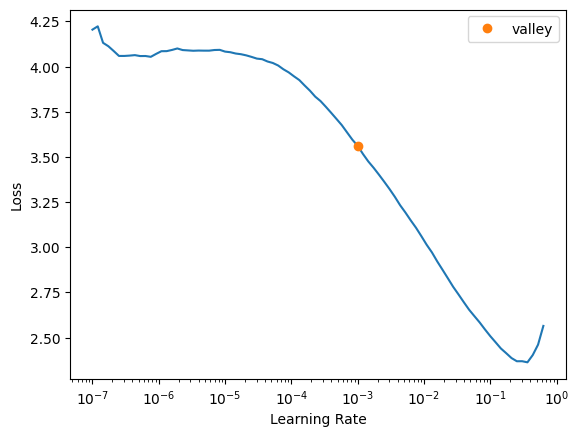

In [15]:
# LR finder for frozen model
learn.lr_find()

In [16]:
%%time

# Fit frozen network (i.e. only last layers), with callbacks
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(9e-3), # specify number of cycles and LR
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.638327,0.968327,0.290569,00:54
1,1.115509,0.705376,0.238991,00:54
2,0.862144,0.643519,0.212178,00:54
3,0.726848,0.544246,0.179499,00:55
4,0.623712,0.483442,0.162462,00:54
5,0.538438,0.398290,0.133600,00:54
6,0.468488,0.394059,0.132204,00:54
7,0.419387,0.349752,0.112559,00:55
8,0.389210,0.320806,0.103994,00:54
9,0.356114,0.310440,0.099339,00:55


Better model found at epoch 0 with valid_loss value: 0.9683268666267395.
Better model found at epoch 1 with valid_loss value: 0.7053760886192322.
Better model found at epoch 2 with valid_loss value: 0.6435185670852661.
Better model found at epoch 3 with valid_loss value: 0.544246256351471.
Better model found at epoch 4 with valid_loss value: 0.48344162106513977.
Better model found at epoch 5 with valid_loss value: 0.3982902467250824.
Better model found at epoch 6 with valid_loss value: 0.39405888319015503.
Better model found at epoch 7 with valid_loss value: 0.34975218772888184.
Better model found at epoch 8 with valid_loss value: 0.3208058774471283.
Better model found at epoch 9 with valid_loss value: 0.3104403614997864.
Better model found at epoch 10 with valid_loss value: 0.2868863344192505.
Better model found at epoch 11 with valid_loss value: 0.2733965516090393.
Better model found at epoch 12 with valid_loss value: 0.26743781566619873.
Better model found at epoch 14 with valid_los

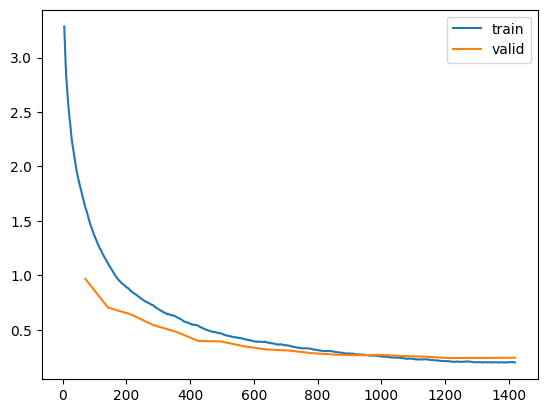

In [17]:
# Save resulting best performing model
learn.load('TempBestModel')
learn.save(filename + '_stage-1_01')
learn.recorder.plot_loss()

In [18]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(9e-2), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.168645,0.740256,0.256121,00:55
1,0.824620,0.537921,0.180244,00:54
2,0.622560,0.414060,0.143283,00:54
3,0.538202,0.488319,0.150265,00:54
4,0.534679,0.452121,0.145610,00:55
5,0.494941,0.377029,0.108742,00:55
6,0.450808,0.335767,0.103994,00:54
7,0.418638,0.368864,0.103435,00:54
8,0.395394,0.388514,0.106973,00:54
9,0.363217,0.285315,0.088260,00:54


Better model found at epoch 0 with valid_loss value: 0.7402563691139221.
Better model found at epoch 1 with valid_loss value: 0.5379205346107483.
Better model found at epoch 2 with valid_loss value: 0.4140600562095642.
Better model found at epoch 5 with valid_loss value: 0.3770293593406677.
Better model found at epoch 6 with valid_loss value: 0.33576712012290955.
Better model found at epoch 9 with valid_loss value: 0.2853146195411682.
Better model found at epoch 12 with valid_loss value: 0.24420985579490662.
Better model found at epoch 14 with valid_loss value: 0.21005535125732422.
Better model found at epoch 16 with valid_loss value: 0.20190954208374023.
Better model found at epoch 17 with valid_loss value: 0.19568894803524017.
CPU times: user 12min 28s, sys: 5min 42s, total: 18min 11s
Wall time: 18min 19s


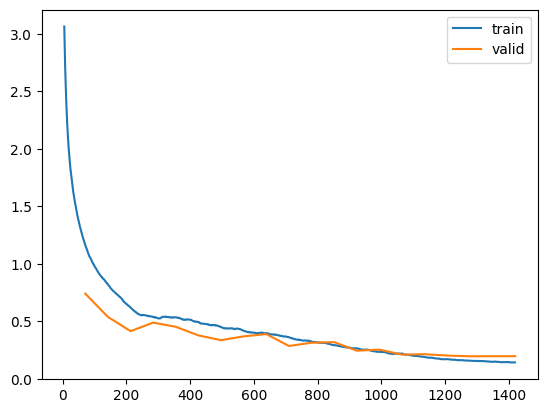

In [19]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_02')
learn.recorder.plot_loss()

In [20]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(6e-2), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.213059,0.743146,0.258170,00:54
1,0.858159,0.603775,0.198957,00:54
2,0.665032,0.462634,0.160320,00:54
3,0.533809,0.388829,0.130714,00:54
4,0.481020,0.422365,0.134252,00:54
5,0.437847,0.342562,0.113583,00:54
6,0.409355,0.517610,0.108184,00:54
7,0.392957,2.102484,0.095894,00:56
8,0.364733,48.296871,0.094870,00:55
9,0.321842,67.289619,0.083605,00:54


Better model found at epoch 0 with valid_loss value: 0.7431455254554749.
Better model found at epoch 1 with valid_loss value: 0.6037753820419312.
Better model found at epoch 2 with valid_loss value: 0.4626341760158539.
Better model found at epoch 3 with valid_loss value: 0.38882920145988464.
Better model found at epoch 5 with valid_loss value: 0.3425619900226593.
Better model found at epoch 11 with valid_loss value: 0.298258900642395.
Better model found at epoch 16 with valid_loss value: 0.20623257756233215.
Better model found at epoch 19 with valid_loss value: 0.19776277244091034.
CPU times: user 12min 32s, sys: 5min 40s, total: 18min 12s
Wall time: 18min 16s


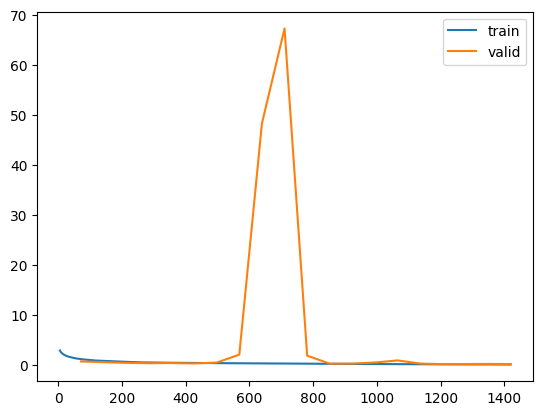

In [21]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_03')
learn.recorder.plot_loss()

In [22]:
%%time 

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(5e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.870109,1.028471,0.308910,00:54
1,1.270666,0.773097,0.252118,00:55
2,0.955514,0.698117,0.226236,00:54
3,0.789571,0.594562,0.202588,00:55
4,0.682588,0.535385,0.180523,00:54
5,0.600160,0.483670,0.165255,00:54
6,0.535475,0.429650,0.142724,00:55
7,0.479418,0.399795,0.136486,00:54
8,0.444054,0.360444,0.120380,00:54
9,0.408136,0.362236,0.118052,00:53


Better model found at epoch 0 with valid_loss value: 1.0284706354141235.
Better model found at epoch 1 with valid_loss value: 0.7730967402458191.
Better model found at epoch 2 with valid_loss value: 0.6981173753738403.
Better model found at epoch 3 with valid_loss value: 0.5945624709129333.
Better model found at epoch 4 with valid_loss value: 0.5353849530220032.
Better model found at epoch 5 with valid_loss value: 0.48367029428482056.
Better model found at epoch 6 with valid_loss value: 0.42964962124824524.
Better model found at epoch 7 with valid_loss value: 0.39979469776153564.
Better model found at epoch 8 with valid_loss value: 0.3604435622692108.
Better model found at epoch 10 with valid_loss value: 0.33725133538246155.
Better model found at epoch 11 with valid_loss value: 0.31420060992240906.
Better model found at epoch 12 with valid_loss value: 0.29965221881866455.
Better model found at epoch 13 with valid_loss value: 0.2966505289077759.
Better model found at epoch 14 with valid

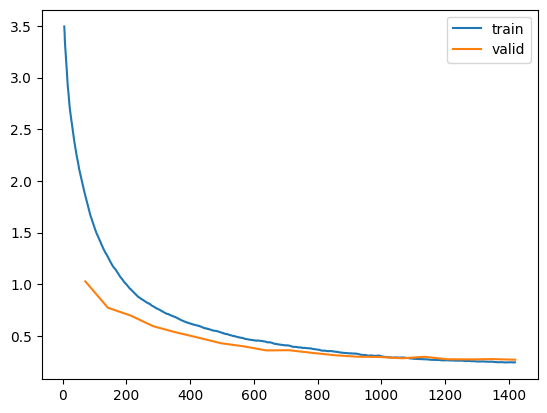

In [23]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_04')
learn.recorder.plot_loss()

In [24]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.612760,0.944434,0.289731,00:54
1,1.090260,0.788619,0.244577,00:54
2,0.844422,0.641954,0.222233,00:54
3,0.712354,0.526026,0.175403,00:55
4,0.612074,0.477101,0.154734,00:53
5,0.523143,0.421202,0.138441,00:53
6,0.462996,0.373831,0.121869,00:54
7,0.418654,0.333820,0.108556,00:55
8,0.376345,0.315403,0.104646,00:56
9,0.344776,0.291882,0.094218,00:54


Better model found at epoch 0 with valid_loss value: 0.9444340467453003.
Better model found at epoch 1 with valid_loss value: 0.7886191010475159.
Better model found at epoch 2 with valid_loss value: 0.6419540643692017.
Better model found at epoch 3 with valid_loss value: 0.5260260105133057.
Better model found at epoch 4 with valid_loss value: 0.47710055112838745.
Better model found at epoch 5 with valid_loss value: 0.4212018847465515.
Better model found at epoch 6 with valid_loss value: 0.37383130192756653.
Better model found at epoch 7 with valid_loss value: 0.3338198959827423.
Better model found at epoch 8 with valid_loss value: 0.3154034912586212.
Better model found at epoch 9 with valid_loss value: 0.291881799697876.
Better model found at epoch 10 with valid_loss value: 0.2897917330265045.
Better model found at epoch 11 with valid_loss value: 0.2774912118911743.
Better model found at epoch 12 with valid_loss value: 0.27511635422706604.
Better model found at epoch 13 with valid_loss

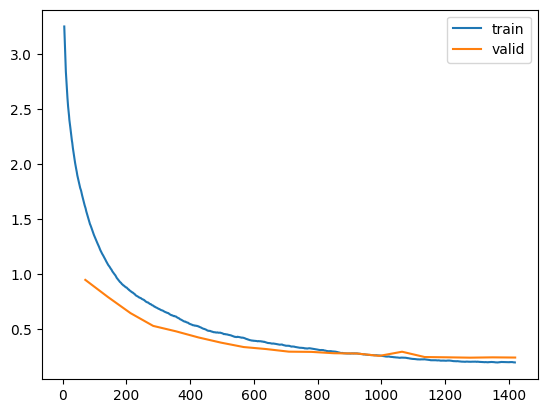

In [25]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_05')
learn.recorder.plot_loss()

In [26]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(50,slice(9e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.703673,0.976577,0.305558,00:54
1,1.255278,0.776232,0.253794,00:54
2,1.004236,0.707030,0.234243,00:53
3,0.843644,0.638875,0.214971,00:54
4,0.738967,0.575238,0.198026,00:54
5,0.661956,0.532082,0.185923,00:54
6,0.599995,0.463613,0.156224,00:55
7,0.542036,0.442983,0.152127,00:54
8,0.495071,0.408013,0.138441,00:54
9,0.460754,0.394658,0.125407,00:53


Better model found at epoch 0 with valid_loss value: 0.9765766859054565.
Better model found at epoch 1 with valid_loss value: 0.7762316465377808.
Better model found at epoch 2 with valid_loss value: 0.7070304155349731.
Better model found at epoch 3 with valid_loss value: 0.6388751268386841.
Better model found at epoch 4 with valid_loss value: 0.5752376914024353.
Better model found at epoch 5 with valid_loss value: 0.5320819020271301.
Better model found at epoch 6 with valid_loss value: 0.4636131525039673.
Better model found at epoch 7 with valid_loss value: 0.4429827034473419.
Better model found at epoch 8 with valid_loss value: 0.4080126881599426.
Better model found at epoch 9 with valid_loss value: 0.39465776085853577.
Better model found at epoch 10 with valid_loss value: 0.3390619456768036.
Better model found at epoch 11 with valid_loss value: 0.3293653726577759.
Better model found at epoch 12 with valid_loss value: 0.31296467781066895.
Better model found at epoch 14 with valid_loss

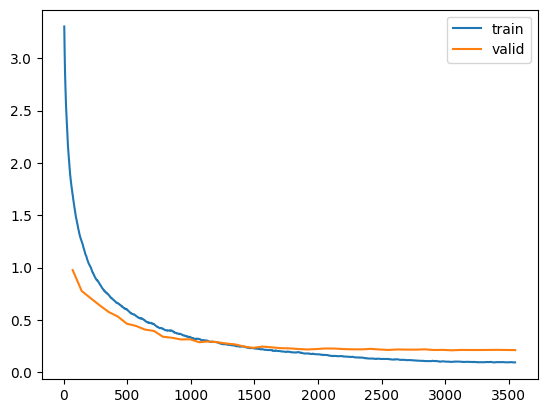

In [27]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_06')
learn.recorder.plot_loss()

In [28]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(50,slice(9e-2), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.208970,0.768239,0.263011,00:54
1,0.859602,0.598616,0.204171,00:54
2,0.693502,0.516886,0.166930,00:54
3,0.589245,0.447816,0.150172,00:54
4,0.498106,0.361394,0.118518,00:55
5,0.456317,0.377847,0.128293,00:54
6,0.431991,0.335658,0.112559,00:54
7,0.425917,0.320923,0.102597,00:54
8,0.450372,0.345742,0.111163,00:55
9,0.454320,0.405389,0.100270,00:55


Better model found at epoch 0 with valid_loss value: 0.7682393789291382.
Better model found at epoch 1 with valid_loss value: 0.5986160635948181.
Better model found at epoch 2 with valid_loss value: 0.5168855786323547.
Better model found at epoch 3 with valid_loss value: 0.44781604409217834.
Better model found at epoch 4 with valid_loss value: 0.36139434576034546.
Better model found at epoch 6 with valid_loss value: 0.3356579542160034.
Better model found at epoch 7 with valid_loss value: 0.3209230899810791.
Better model found at epoch 18 with valid_loss value: 0.29190653562545776.
Better model found at epoch 21 with valid_loss value: 0.2407110631465912.
Better model found at epoch 27 with valid_loss value: 0.22422777116298676.
Better model found at epoch 30 with valid_loss value: 0.21118830144405365.
Better model found at epoch 38 with valid_loss value: 0.20158033072948456.
Better model found at epoch 39 with valid_loss value: 0.19537316262722015.
Better model found at epoch 42 with va

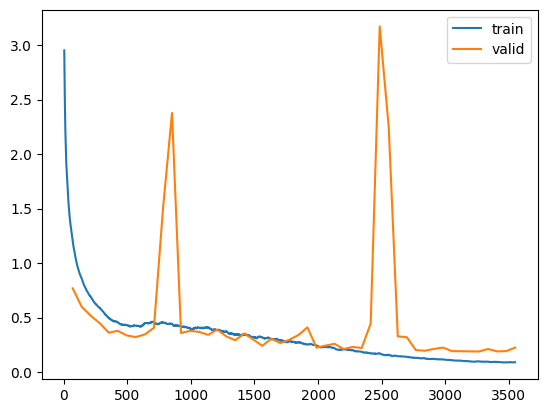

In [29]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_07')
learn.recorder.plot_loss()

In [30]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(50,slice(6e-2), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,1.266851,0.780360,0.275580,00:54
1,0.889124,0.617262,0.213853,00:55
2,0.721853,0.558781,0.194023,00:54
3,0.621996,0.459947,0.152220,00:55
4,0.536930,0.403691,0.134531,00:54
5,0.470827,0.373025,0.129969,00:54
6,0.430132,0.341350,0.114049,00:54
7,0.405722,0.319825,0.104553,00:55
8,0.388471,0.316585,0.101201,00:54
9,0.385295,0.311245,0.103994,00:54


Better model found at epoch 0 with valid_loss value: 0.7803598046302795.
Better model found at epoch 1 with valid_loss value: 0.6172623038291931.
Better model found at epoch 2 with valid_loss value: 0.5587806105613708.
Better model found at epoch 3 with valid_loss value: 0.4599471986293793.
Better model found at epoch 4 with valid_loss value: 0.4036914110183716.
Better model found at epoch 5 with valid_loss value: 0.37302517890930176.
Better model found at epoch 6 with valid_loss value: 0.3413497805595398.
Better model found at epoch 7 with valid_loss value: 0.3198249042034149.
Better model found at epoch 8 with valid_loss value: 0.31658482551574707.
Better model found at epoch 9 with valid_loss value: 0.3112446963787079.
Better model found at epoch 12 with valid_loss value: 0.3088740110397339.
Better model found at epoch 13 with valid_loss value: 0.28706997632980347.
Better model found at epoch 16 with valid_loss value: 0.28124573826789856.
Better model found at epoch 17 with valid_lo

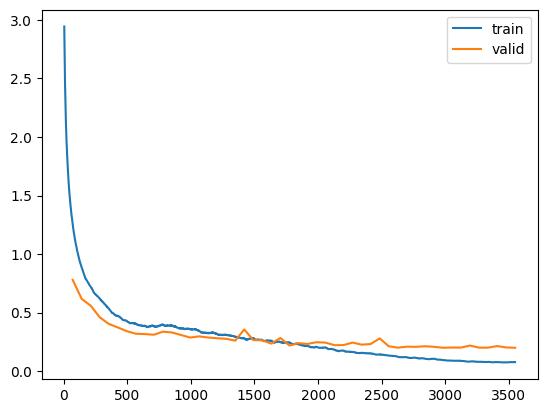

In [31]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_08')
learn.recorder.plot_loss()

In [32]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(4e-4), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,3.179888,1.872398,0.562331,00:54
1,2.326522,1.238898,0.380132,00:54
2,1.749167,0.998949,0.309655,00:54
3,1.396319,0.861627,0.271762,00:54
4,1.166300,0.780495,0.254073,00:55
5,1.031765,0.713649,0.235546,00:55
6,0.934638,0.673983,0.221674,00:55
7,0.856554,0.636751,0.215343,00:54
8,0.800631,0.629011,0.207523,00:55
9,0.759573,0.590868,0.199330,00:54


Better model found at epoch 0 with valid_loss value: 1.872398018836975.
Better model found at epoch 1 with valid_loss value: 1.2388979196548462.
Better model found at epoch 2 with valid_loss value: 0.9989486932754517.
Better model found at epoch 3 with valid_loss value: 0.8616270422935486.
Better model found at epoch 4 with valid_loss value: 0.780494749546051.
Better model found at epoch 5 with valid_loss value: 0.7136493921279907.
Better model found at epoch 6 with valid_loss value: 0.6739833950996399.
Better model found at epoch 7 with valid_loss value: 0.6367507576942444.
Better model found at epoch 8 with valid_loss value: 0.6290113925933838.
Better model found at epoch 9 with valid_loss value: 0.5908682942390442.
Better model found at epoch 10 with valid_loss value: 0.5635988116264343.
Better model found at epoch 11 with valid_loss value: 0.5556880235671997.
Better model found at epoch 12 with valid_loss value: 0.5293632745742798.
Better model found at epoch 14 with valid_loss val

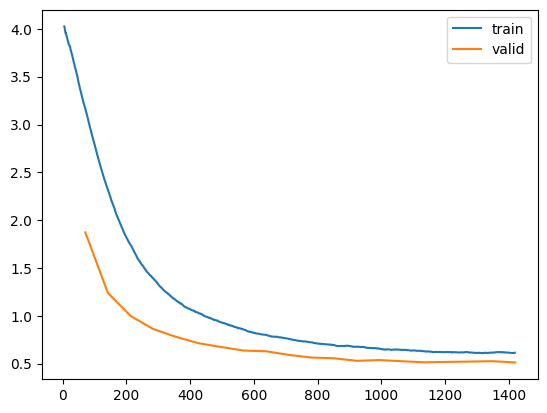

In [33]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_09')
learn.recorder.plot_loss()

In [34]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_00')
learn.fit_one_cycle(20,slice(7e-4), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,2.863582,1.629655,0.483847,00:54
1,2.026013,1.098280,0.336747,00:55
2,1.513456,0.878426,0.277814,00:54
3,1.205217,0.782565,0.253142,00:54
4,1.011891,0.704541,0.230425,00:54
5,0.888671,0.672543,0.224560,00:54
6,0.798998,0.606146,0.205754,00:54
7,0.744467,0.583727,0.193371,00:55
8,0.694423,0.561904,0.190764,00:54
9,0.653315,0.540949,0.179034,00:54


Better model found at epoch 0 with valid_loss value: 1.6296546459197998.
Better model found at epoch 1 with valid_loss value: 1.0982797145843506.
Better model found at epoch 2 with valid_loss value: 0.8784257173538208.
Better model found at epoch 3 with valid_loss value: 0.7825645208358765.
Better model found at epoch 4 with valid_loss value: 0.7045409083366394.
Better model found at epoch 5 with valid_loss value: 0.6725432276725769.
Better model found at epoch 6 with valid_loss value: 0.6061460375785828.
Better model found at epoch 7 with valid_loss value: 0.5837265849113464.
Better model found at epoch 8 with valid_loss value: 0.5619043707847595.
Better model found at epoch 9 with valid_loss value: 0.5409485101699829.
Better model found at epoch 10 with valid_loss value: 0.5106800198554993.
Better model found at epoch 11 with valid_loss value: 0.5033307671546936.
Better model found at epoch 12 with valid_loss value: 0.4822342097759247.
Better model found at epoch 13 with valid_loss v

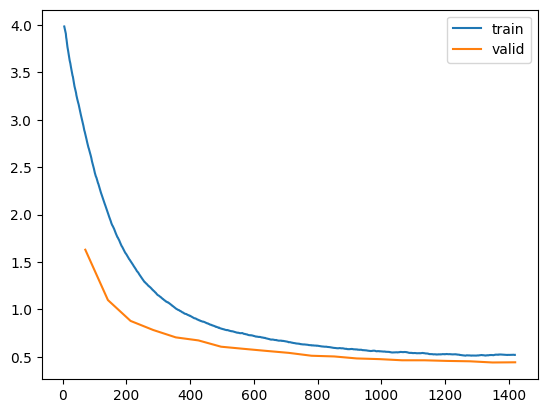

In [35]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-1_10')
learn.recorder.plot_loss()

The above two steps can be repeated any number of times, until the performance is satisfactory

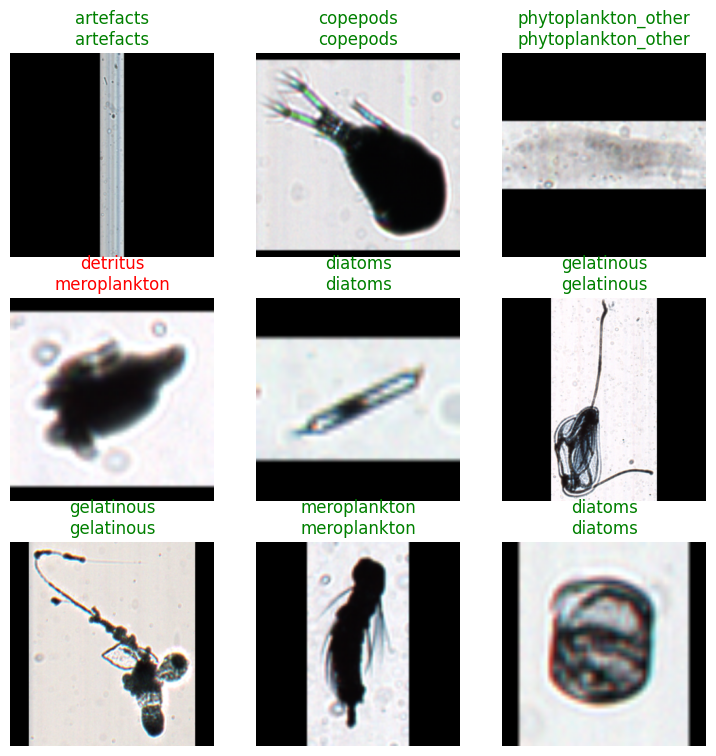

In [64]:
# Select best stage-1 model, save and show results
learn.load(filename + '_stage-1_07') # Manually select best stage 1 model
learn.save(filename + '_stage-1_Best')
learn.show_results()

#### Stage_2 (unfrozen model)

In [14]:
# Load best performing Stage_1 model
learn.load(filename + '_stage-1_Best')
learn.unfreeze()

SuggestedLRs(valley=3.0199516913853586e-05)

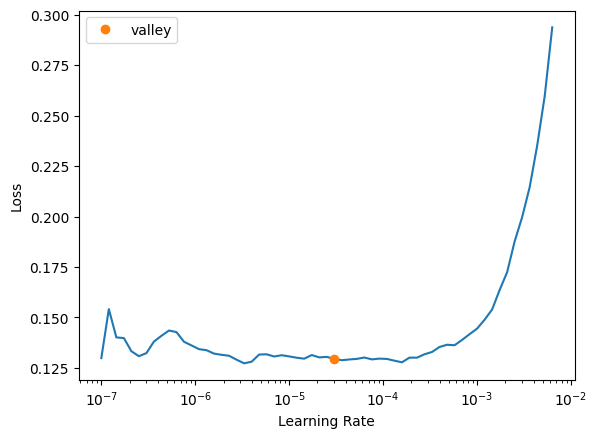

In [15]:
# LR finder for unfrozen model 
learn.lr_find()

In [16]:
%%time

# Fit unfrozen network (i.e. all layers), with callbacks
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(1e-6,1e-4), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.126584,0.082702,0.018155,01:01
1,0.126541,0.081396,0.017969,01:02
2,0.123433,0.059419,0.017689,01:01
3,0.121626,0.060357,0.018155,01:02
4,0.120489,0.059713,0.018620,01:01
5,0.118928,0.084383,0.018527,01:02
6,0.112320,0.060696,0.019365,01:02
7,0.110530,0.061238,0.018527,01:01
8,0.107674,0.062330,0.019644,01:03
9,0.107473,0.061090,0.018900,01:03


Better model found at epoch 0 with valid_loss value: 0.08270249515771866.
Better model found at epoch 1 with valid_loss value: 0.08139588683843613.
Better model found at epoch 2 with valid_loss value: 0.05941927805542946.
CPU times: user 13min 53s, sys: 6min 56s, total: 20min 50s
Wall time: 20min 49s


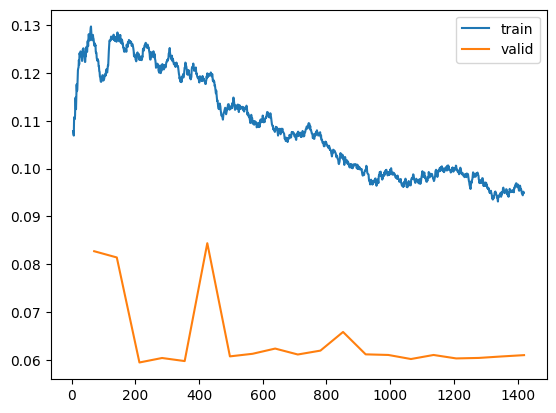

In [17]:
# Save resulting best performing model
learn.load('TempBestModel')
learn.save(filename + '_stage-2_01')
learn.recorder.plot_loss()

In [18]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(3e-6,3e-4), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.125190,0.075095,0.018155,01:02
1,0.126555,0.060001,0.017875,01:02
2,0.125888,0.069357,0.018713,01:01
3,0.121130,0.063369,0.019179,01:01
4,0.118329,0.063349,0.019737,01:02
5,0.115378,0.068152,0.019924,01:02
6,0.110303,0.066816,0.020668,01:01
7,0.101024,0.065138,0.019272,01:02
8,0.096810,0.067099,0.020668,01:02
9,0.095169,0.067621,0.020017,01:01


Better model found at epoch 0 with valid_loss value: 0.07509519159793854.
Better model found at epoch 1 with valid_loss value: 0.060000915080308914.
CPU times: user 13min 55s, sys: 6min 54s, total: 20min 50s
Wall time: 20min 45s


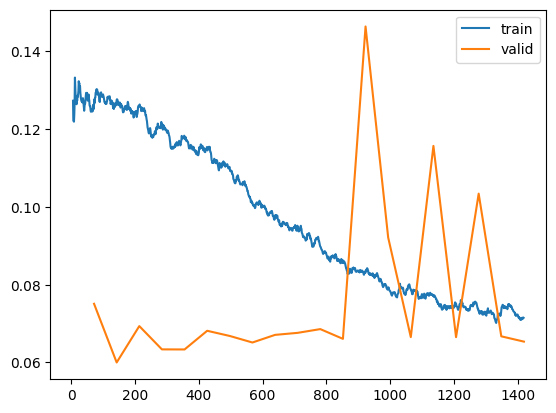

In [19]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_02')
learn.recorder.plot_loss()

In [20]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(3e-5,3e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.132981,0.063393,0.018900,01:03
1,0.130742,0.100755,0.027186,01:02
2,0.153565,0.118523,0.039568,01:02
3,0.171402,0.243430,0.048319,01:01
4,0.170558,0.139681,0.045713,01:01
5,0.159970,0.141968,0.046085,01:02
6,0.146658,0.163013,0.055954,01:03
7,0.136632,0.129529,0.043664,01:01
8,0.127142,0.211789,0.046085,01:02
9,0.114391,0.132772,0.042175,01:03


Better model found at epoch 0 with valid_loss value: 0.0633929893374443.
CPU times: user 13min 52s, sys: 6min 56s, total: 20min 49s
Wall time: 20min 52s


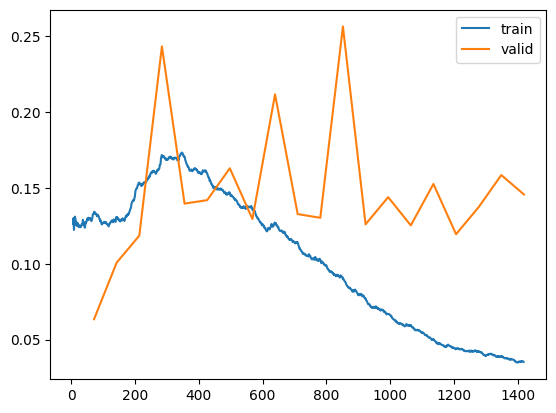

In [21]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_03')
learn.recorder.plot_loss()

In [22]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(3e-7,3e-5), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.124015,0.060727,0.018620,01:03
1,0.125735,0.059622,0.017782,01:01
2,0.130041,0.061959,0.017969,01:01
3,0.125543,0.083307,0.017503,01:02
4,0.122206,0.061206,0.017131,01:03
5,0.127312,0.059610,0.017689,01:02
6,0.119455,0.058994,0.017503,01:01
7,0.116876,0.059871,0.017596,01:03
8,0.120481,0.059447,0.017503,01:04
9,0.114987,0.058989,0.017875,01:04


Better model found at epoch 0 with valid_loss value: 0.06072746962308884.
Better model found at epoch 1 with valid_loss value: 0.05962170287966728.
Better model found at epoch 5 with valid_loss value: 0.059610091149806976.
Better model found at epoch 6 with valid_loss value: 0.058994095772504807.
Better model found at epoch 9 with valid_loss value: 0.05898915231227875.
CPU times: user 13min 53s, sys: 6min 56s, total: 20min 50s
Wall time: 20min 54s


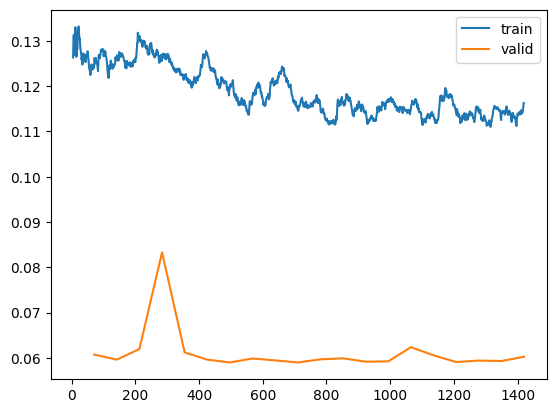

In [23]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_04')
learn.recorder.plot_loss()

In [24]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(10,slice(10e-4,10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.293870,0.658461,0.153431,01:02
1,0.407834,0.679222,0.224467,01:01
2,0.408531,0.885794,0.292803,01:02
3,0.371042,0.372227,0.126525,01:02
4,0.312705,0.279778,0.083977,01:01
5,0.256694,2.164843,0.076715,01:01
6,0.216860,3.714666,0.062098,01:02
7,0.177458,0.160547,0.053254,01:01
8,0.146940,0.142225,0.046551,01:02
9,0.124854,0.157433,0.045992,01:02


Better model found at epoch 0 with valid_loss value: 0.6584612131118774.
Better model found at epoch 3 with valid_loss value: 0.3722269833087921.
Better model found at epoch 4 with valid_loss value: 0.2797779142856598.
Better model found at epoch 7 with valid_loss value: 0.1605473905801773.
Better model found at epoch 8 with valid_loss value: 0.14222493767738342.
CPU times: user 6min 58s, sys: 3min 28s, total: 10min 26s
Wall time: 10min 24s


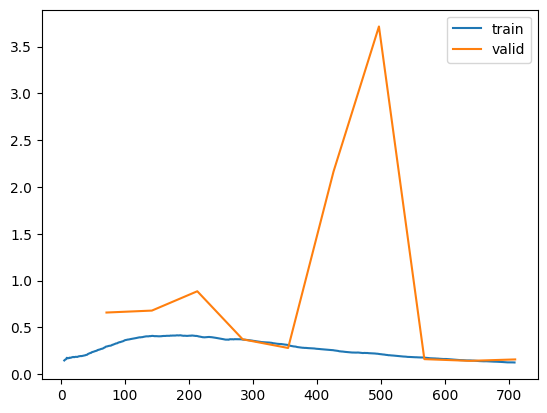

In [25]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_05')
learn.recorder.plot_loss()

In [26]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(10e-4,10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.205659,0.198779,0.058561,01:01
1,0.321933,0.454143,0.141048,01:02
2,0.353217,1.029497,0.213760,01:01
3,0.363258,0.486071,0.161344,01:02
4,0.343134,0.346242,0.119542,01:02
5,0.312075,0.633863,0.140676,01:01
6,0.280436,0.414484,0.142259,01:02
7,0.277267,5.988473,0.114794,01:02
8,0.264971,0.389698,0.128759,01:02
9,0.232391,0.263122,0.089098,01:01


Better model found at epoch 0 with valid_loss value: 0.1987791359424591.
Better model found at epoch 11 with valid_loss value: 0.19064591825008392.
Better model found at epoch 15 with valid_loss value: 0.14808179438114166.
Better model found at epoch 18 with valid_loss value: 0.141011580824852.
CPU times: user 13min 53s, sys: 6min 54s, total: 20min 47s
Wall time: 20min 48s


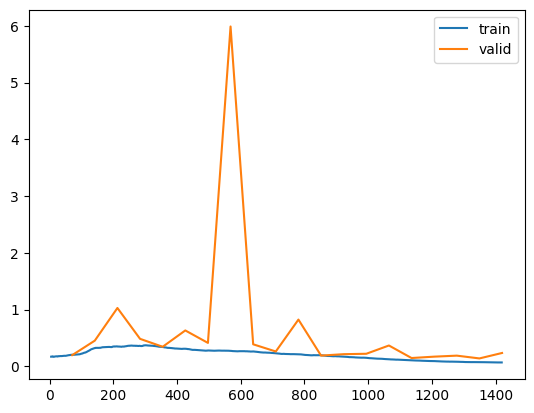

In [27]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_06')
learn.recorder.plot_loss()

In [28]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(10,slice(10e-4,10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.303878,2.974945,0.252863,01:02
1,0.502294,1.074073,0.343637,01:03
2,0.433119,0.415879,0.144493,01:01
3,0.344595,0.320378,0.114328,01:01
4,0.282749,6.130047,0.087608,01:01
5,0.252297,0.229809,0.076808,01:02
6,0.208654,0.229339,0.065450,01:01
7,0.175968,0.165701,0.057537,01:03
8,0.141795,0.292799,0.049623,01:02
9,0.123116,0.193823,0.049064,01:02


Better model found at epoch 0 with valid_loss value: 2.974945068359375.
Better model found at epoch 1 with valid_loss value: 1.074073314666748.
Better model found at epoch 2 with valid_loss value: 0.4158785045146942.
Better model found at epoch 3 with valid_loss value: 0.32037776708602905.
Better model found at epoch 5 with valid_loss value: 0.22980935871601105.
Better model found at epoch 6 with valid_loss value: 0.229338601231575.
Better model found at epoch 7 with valid_loss value: 0.16570129990577698.
CPU times: user 6min 59s, sys: 3min 28s, total: 10min 27s
Wall time: 10min 26s


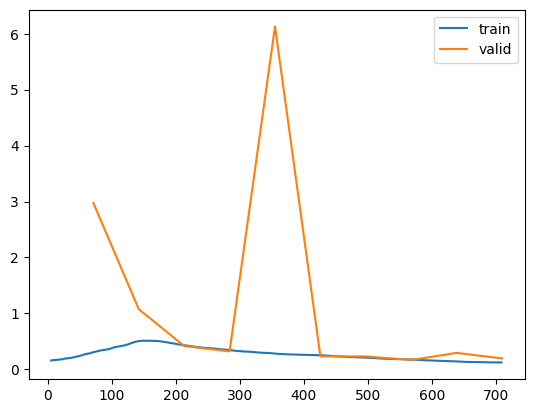

In [29]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_07')
learn.recorder.plot_loss()

In [30]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(50,slice(10e-4,10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.183800,0.108751,0.037613,01:02
1,0.181336,0.152727,0.054464,01:03
2,0.210008,0.231054,0.072247,01:02
3,0.252426,0.362407,0.100922,01:02
4,0.272006,0.339616,0.114421,01:01
5,0.275156,0.353720,0.120473,01:01
6,0.295068,1.528713,0.202681,01:02
7,0.319814,0.316103,0.106973,01:01
8,0.286297,0.363821,0.125594,01:01
9,0.282975,0.420819,0.148962,01:01


Better model found at epoch 0 with valid_loss value: 0.10875099152326584.
CPU times: user 34min 41s, sys: 17min 15s, total: 51min 56s
Wall time: 51min 51s


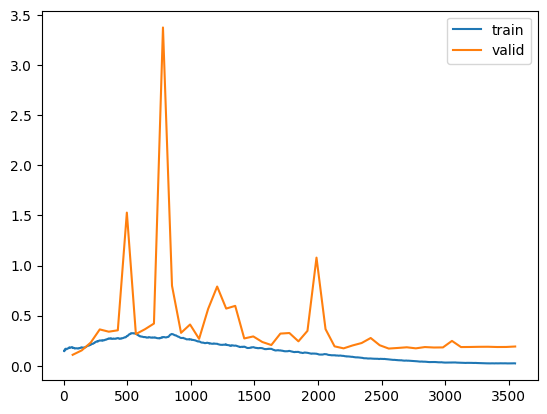

In [31]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_08')
learn.recorder.plot_loss()

In [32]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(20,slice(10e-4,10e-3), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.215193,0.330645,0.064892,01:03
1,0.300736,0.580218,0.159948,01:02
2,0.328014,3.108220,0.152220,01:03
3,0.379859,0.626248,0.202123,01:01
4,0.375148,0.434599,0.153896,01:02
5,0.344173,5.546677,0.143003,01:03
6,0.298624,0.413807,0.139279,01:02
7,0.268603,0.338942,0.120473,01:03
8,0.254341,0.253517,0.085932,01:02
9,0.235984,0.290654,0.096360,01:01


Better model found at epoch 0 with valid_loss value: 0.3306451439857483.
Better model found at epoch 8 with valid_loss value: 0.2535165846347809.
Better model found at epoch 12 with valid_loss value: 0.2472381889820099.
Better model found at epoch 13 with valid_loss value: 0.16517381370067596.
Better model found at epoch 14 with valid_loss value: 0.16015534102916718.
Better model found at epoch 16 with valid_loss value: 0.1428987681865692.
Better model found at epoch 18 with valid_loss value: 0.1419152468442917.
CPU times: user 13min 55s, sys: 6min 56s, total: 20min 51s
Wall time: 20min 58s


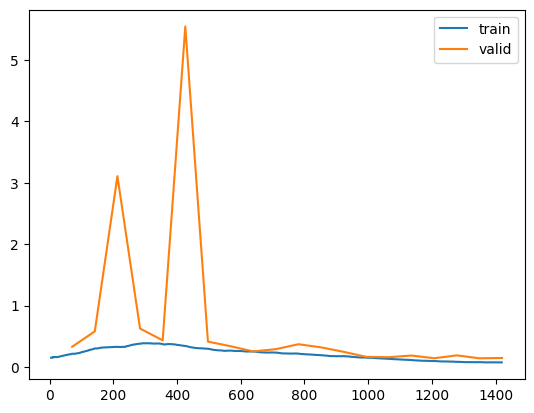

In [33]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_09')
learn.recorder.plot_loss()

In [34]:
%%time

# Repeat above two steps, with different number of cycles and/or LR
learn.load(filename + '_stage-1_Best')
learn.unfreeze()
learn.fit_one_cycle(50,slice(3e-7,3e-5), 
                    cbs=SaveModelCallback(monitor='valid_loss', with_opt=True, fname ='TempBestModel')
                   )

epoch,train_loss,valid_loss,error_rate,time
0,0.126850,0.059996,0.017689,01:02
1,0.126115,0.073062,0.017782,01:02
2,0.128365,0.087917,0.018341,01:01
3,0.128805,0.059913,0.017596,01:02
4,0.126035,0.060444,0.018434,01:02
5,0.125457,0.059959,0.018062,01:02
6,0.124937,0.059539,0.017689,01:01
7,0.125464,0.060438,0.017969,01:02
8,0.124498,0.063047,0.017689,01:02
9,0.119303,0.060054,0.017969,01:02


Better model found at epoch 0 with valid_loss value: 0.05999588966369629.
Better model found at epoch 3 with valid_loss value: 0.05991283804178238.
Better model found at epoch 6 with valid_loss value: 0.05953940749168396.
Better model found at epoch 10 with valid_loss value: 0.059252817183732986.
Better model found at epoch 11 with valid_loss value: 0.05916723236441612.
CPU times: user 34min 37s, sys: 17min 16s, total: 51min 54s
Wall time: 51min 57s


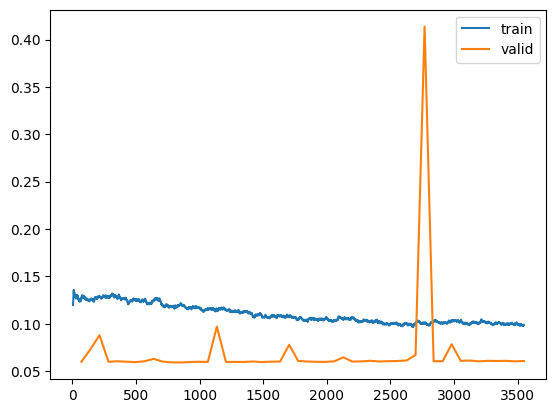

In [35]:
# Same as above, save resulting best performing model, but with different filename
learn.load('TempBestModel')
learn.save(filename + '_stage-2_10')
learn.recorder.plot_loss()

The above two steps can be repeated any number of times, until the performance is satisfactory

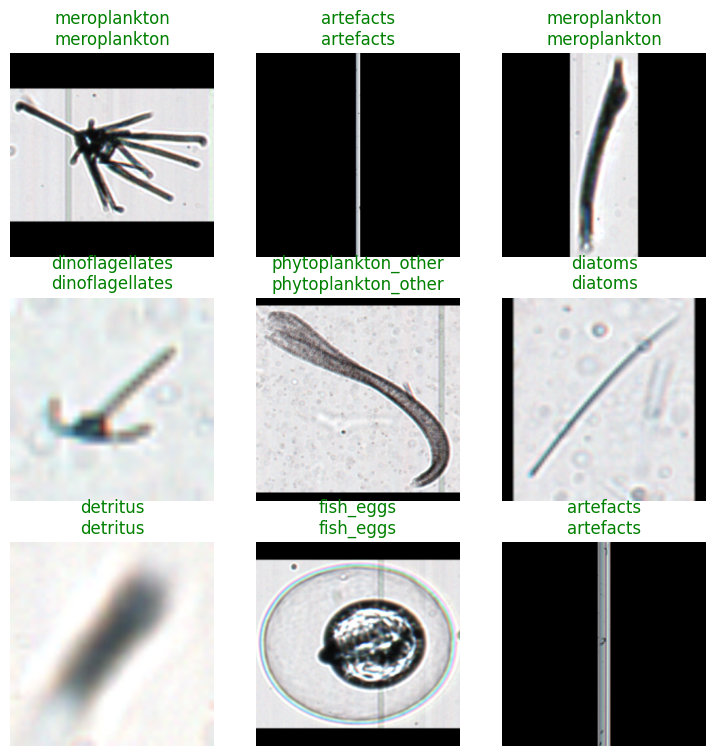

In [36]:
# Select best stage-2 model, save and show results
learn.load(filename + '_stage-2_04') # select best stage 2 model
learn.save(filename + '_stage-2_Best') 
learn.show_results()

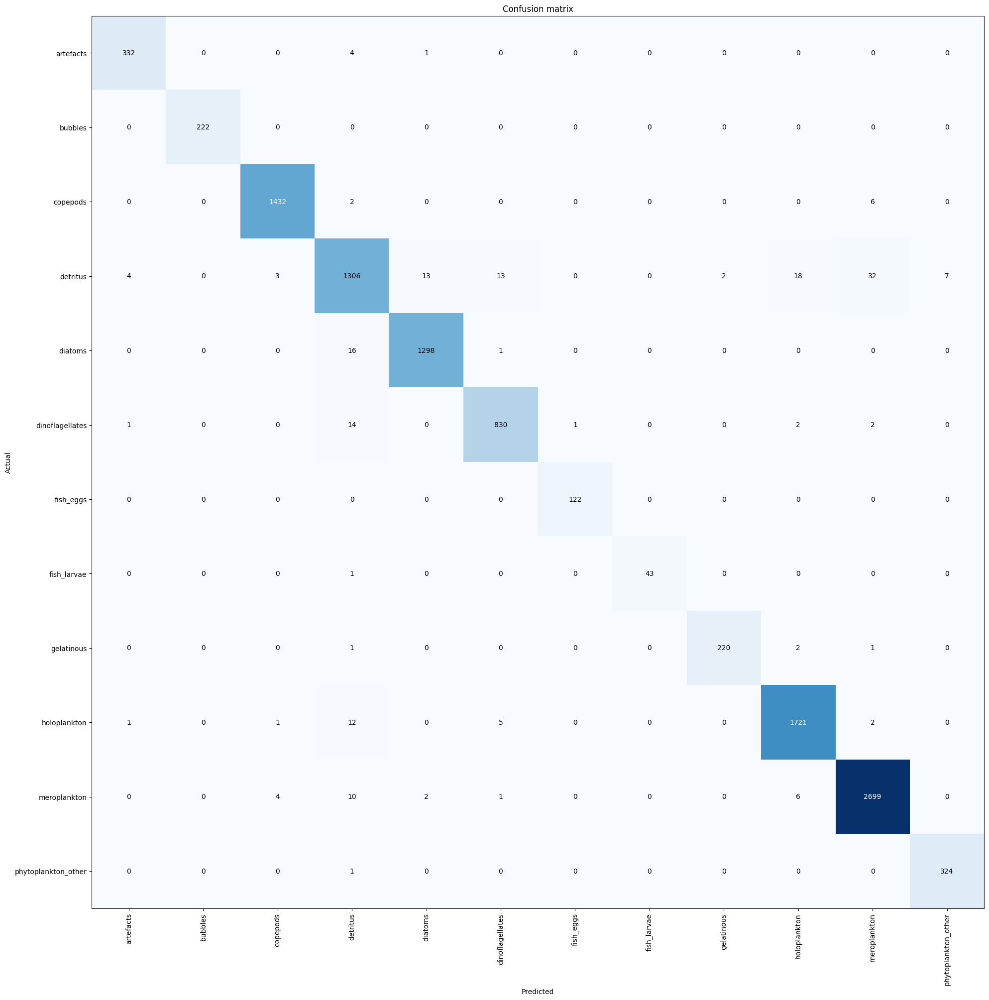

In [37]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(20, 20))

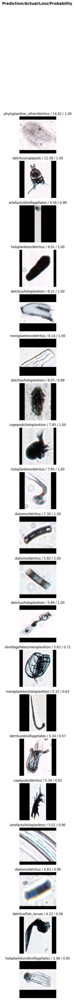

In [38]:
interp.plot_top_losses(20, nrows=20)

In [39]:
interp.most_confused(min_val=2) #p204 book

[('detritus', 'meroplankton', 32),
 ('detritus', 'holoplankton', 18),
 ('diatoms', 'detritus', 16),
 ('dinoflagellates', 'detritus', 14),
 ('detritus', 'diatoms', 13),
 ('detritus', 'dinoflagellates', 13),
 ('holoplankton', 'detritus', 12),
 ('meroplankton', 'detritus', 10),
 ('detritus', 'phytoplankton_other', 7),
 ('copepods', 'meroplankton', 6),
 ('meroplankton', 'holoplankton', 6),
 ('holoplankton', 'dinoflagellates', 5),
 ('artefacts', 'detritus', 4),
 ('detritus', 'artefacts', 4),
 ('meroplankton', 'copepods', 4),
 ('detritus', 'copepods', 3),
 ('copepods', 'detritus', 2),
 ('detritus', 'gelatinous', 2),
 ('dinoflagellates', 'holoplankton', 2),
 ('dinoflagellates', 'meroplankton', 2),
 ('gelatinous', 'holoplankton', 2),
 ('holoplankton', 'meroplankton', 2),
 ('meroplankton', 'diatoms', 2)]

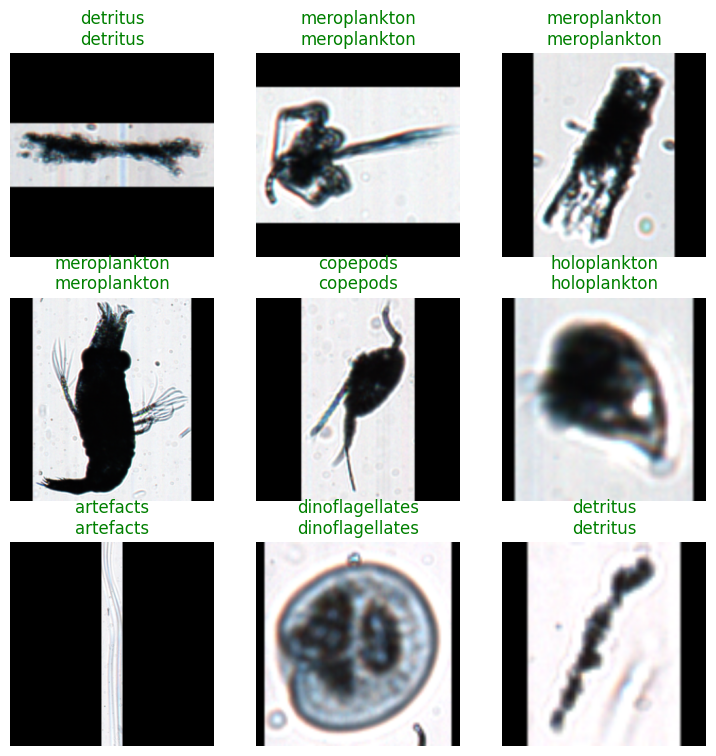

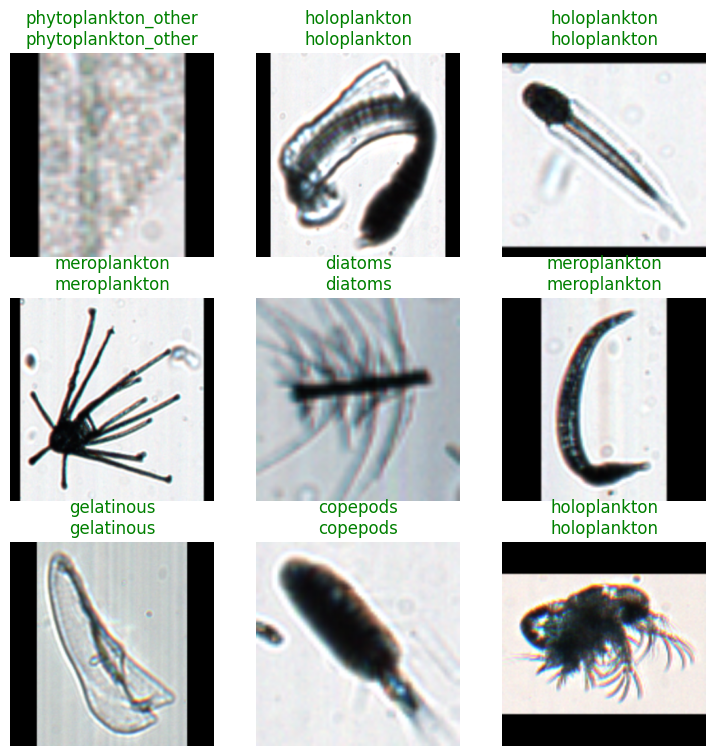

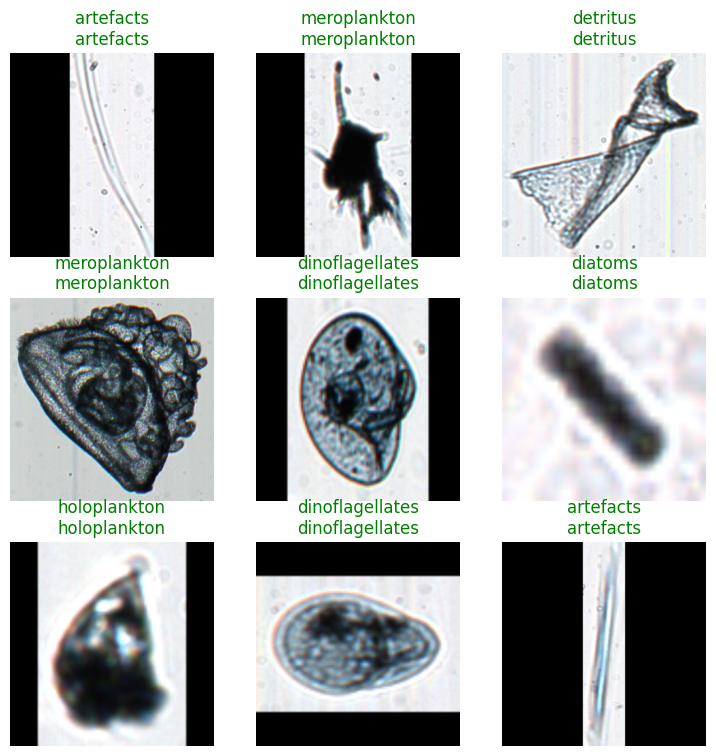

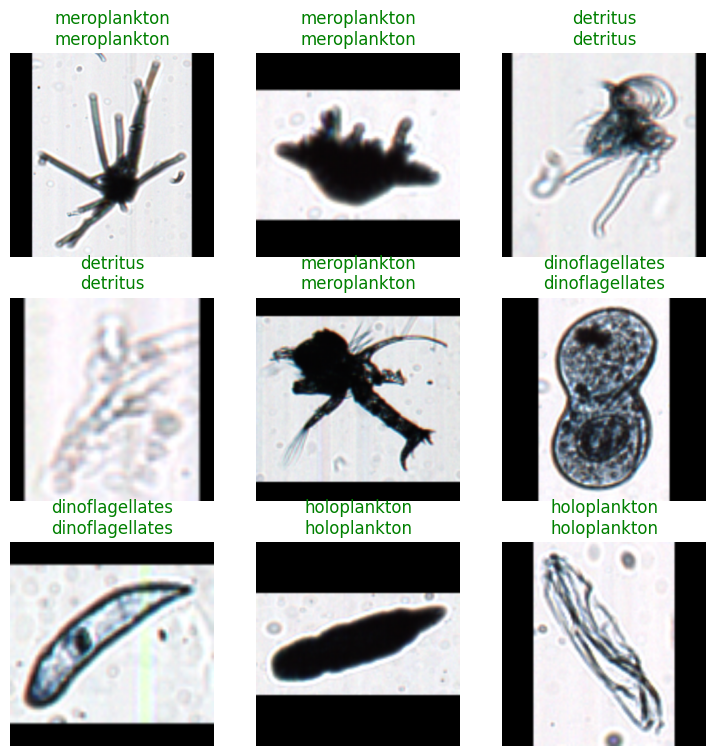

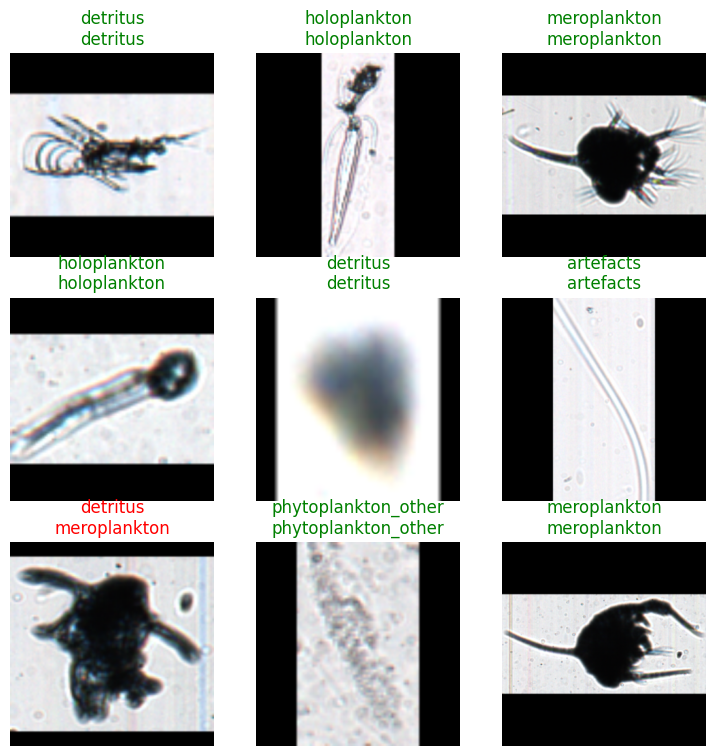

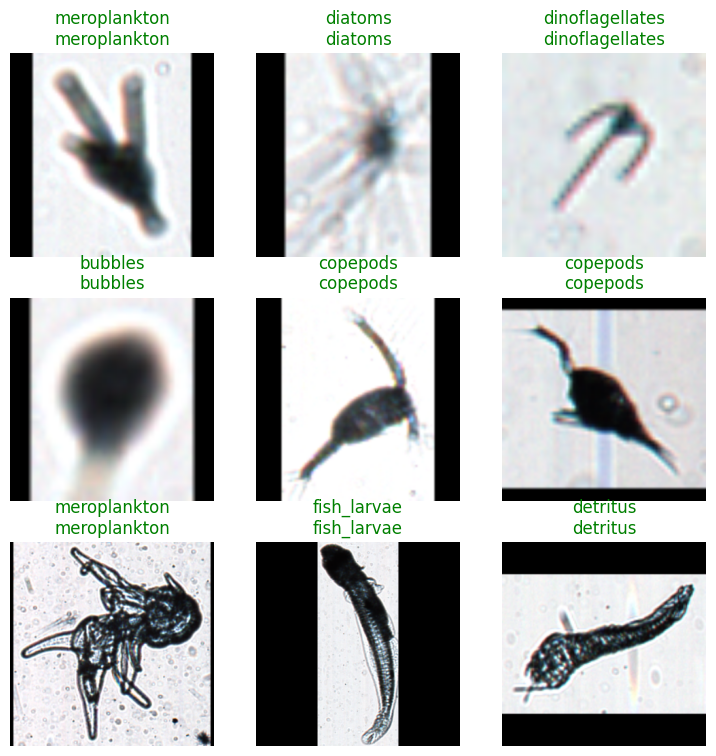

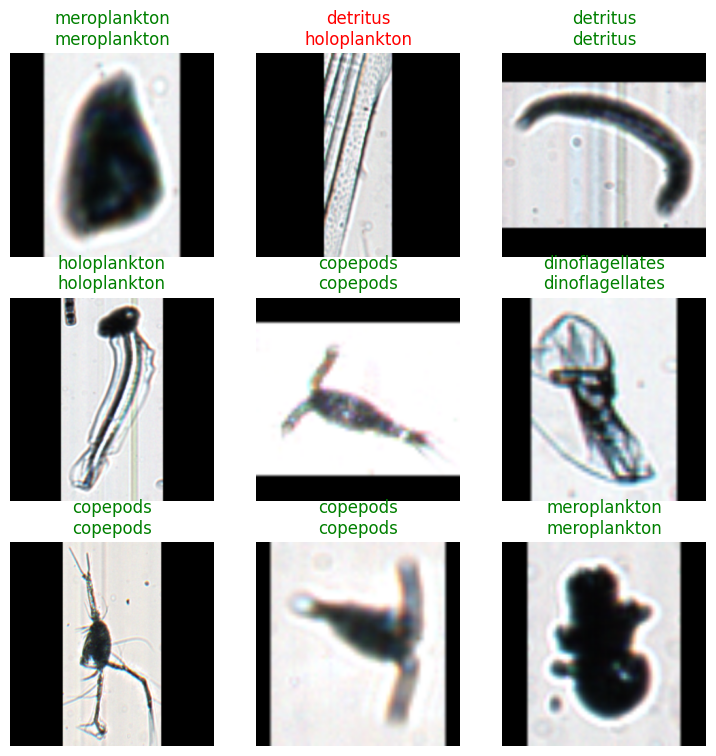

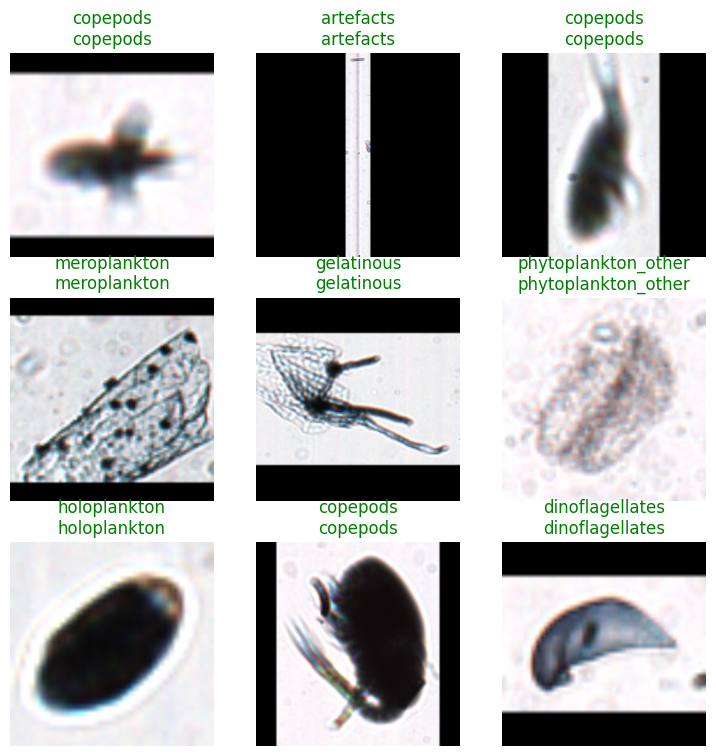

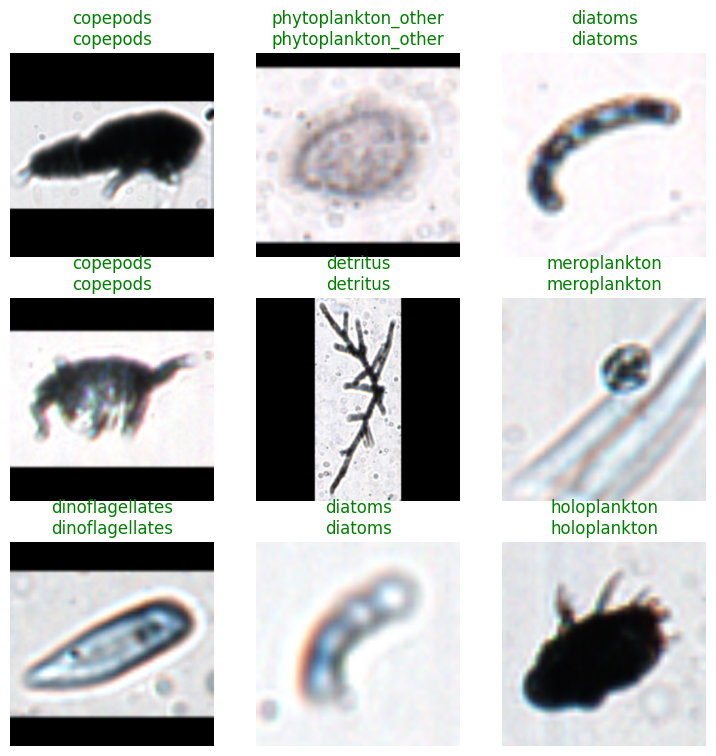

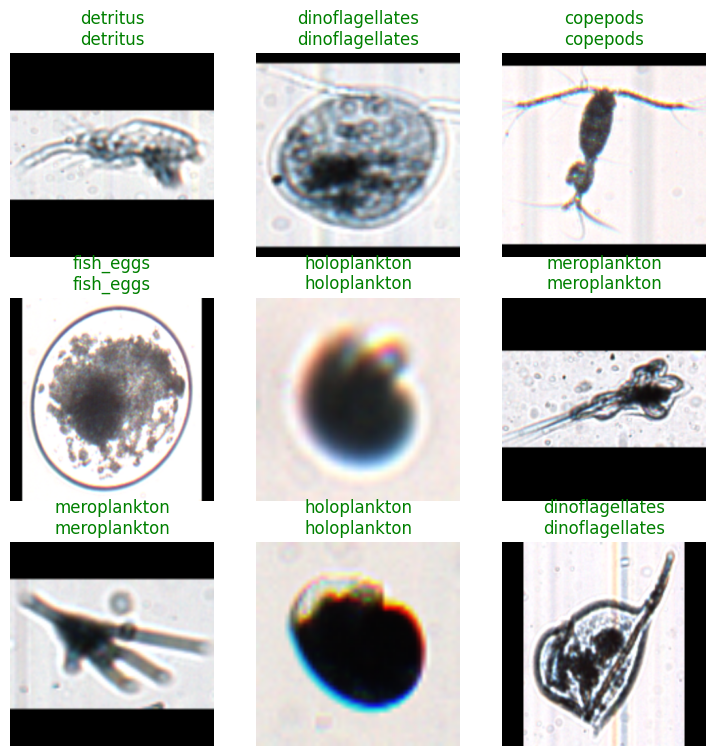

In [40]:
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()
learn.show_results()

In [54]:
# Some CUDA/GPU tests

def check_all_cuda_devices():
    device_count = torch.cuda.device_count()
    for i in range(device_count):
        print('>>>> torch.cuda.device({})'.format(i))
        result = torch.cuda.device(i)
        print(result, '\n')

        print('>>>> torch.cuda.get_device_name({})'.format(i))
        result = torch.cuda.get_device_name(i)
        print(result, '\n')


def check_cuda():
    print('>>>> torch.cuda.is_available()')
    result = torch.cuda.is_available()
    print(result, '\n')

    print('>>>> torch.cuda.device_count()')
    result = torch.cuda.device_count()
    print(result, '\n')

    print('>>>> torch.cuda.current_device()')
    result = torch.cuda.current_device()
    print(result, '\n')

    print('>>>> torch.cuda.device(0)')
    result = torch.cuda.device(0)
    print(result, '\n')

    print('>>>> torch.cuda.get_device_name(0)')
    result = torch.cuda.get_device_name(0)
    print(result, '\n')

    check_all_cuda_devices()


def check_cuda_ops():
    print('>>>> torch.zeros(2, 3)')
    zeros = torch.zeros(2, 3)
    print(zeros, '\n')

    print('>>>> torch.zeros(2, 3).cuda()')
    cuda_zero = torch.zeros(2, 3).cuda()
    print(cuda_zero, '\n')

    print('>>>> torch.tensor([[1, 2, 3], [4, 5, 6]])')
    tensor_a = torch.tensor([[1, 2, 3], [4, 5, 6]]).cuda()
    print(tensor_a, '\n')

    print('>>>> tensor_a + cuda_zero')
    sum = tensor_a + cuda_zero
    print(sum, '\n')

    print('>>>> tensor_a * cuda_twos')
    tensor_a = tensor_a.to(torch.float)
    cuda_zero = cuda_zero.to(torch.float)
    cuda_twos = (cuda_zero + 1.0) * 2.0
    product = tensor_a * cuda_twos
    print(product, '\n')

    print('>>>> torch.matmul(tensor_a, cuda_twos.T)')
    mat_mul = torch.matmul(tensor_a, cuda_twos.T)
    print(mat_mul, '\n')

try:
    check_all_cuda_devices()
except Exception as e:
    print('get_version() failed, exception message below:')
    print(e)

try:
    check_cuda()
except Exception as e:
    print('check_cuda() failed, exception message below:')
    print(e)

try:
    check_cuda_ops()
except Exception as e:
    print('check_cuda_ops() failed, exception message below:')
    print(e)

>>>> torch.cuda.device(0)

>>>> torch.cuda.get_device_name(0)
NVIDIA A100 80GB PCIe 

>>>> torch.cuda.is_available()
True 

>>>> torch.cuda.device_count()
1 

>>>> torch.cuda.current_device()
0 

>>>> torch.cuda.device(0)

>>>> torch.cuda.get_device_name(0)
NVIDIA A100 80GB PCIe 

>>>> torch.cuda.device(0)

>>>> torch.cuda.get_device_name(0)
NVIDIA A100 80GB PCIe 

>>>> torch.zeros(2, 3)
tensor([[0., 0., 0.],
        [0., 0., 0.]]) 

>>>> torch.zeros(2, 3).cuda()
tensor([[0., 0., 0.],
        [0., 0., 0.]], device='cuda:0') 

>>>> torch.tensor([[1, 2, 3], [4, 5, 6]])
tensor([[1, 2, 3],
        [4, 5, 6]], device='cuda:0') 

>>>> tensor_a + cuda_zero
tensor([[1., 2., 3.],
        [4., 5., 6.]], device='cuda:0') 

>>>> tensor_a * cuda_twos
tensor([[ 2.,  4.,  6.],
        [ 8., 10., 12.]], device='cuda:0') 

>>>> torch.matmul(tensor_a, cuda_twos.T)
tensor([[12., 12.],
        [30., 30.]], device='cuda:0') 

